In [1]:
import sys
import os
sys.path.append('..')
from adjoint_esn.dynamical_systems import MultiStable
import adjoint_esn.solve_ode as solve_ode
import numpy as np
import matplotlib.pyplot as plt
from adjoint_esn.esn import ESN
from adjoint_esn.utils import preprocessing as pp
from adjoint_esn.utils import signals as sig

In [2]:
def load_data_sys(epsilon):
   my_sys = MultiStable(alpha=-0.02,beta=0.15,k=1.0,epsilon=epsilon)

   dt = 1e-2

   t_transient_len = 1000
   t_washout_len = 1
   t_train_len = 600
   t_val_len = 300
   t_sim_len = 2000

   t_sim = np.arange(0,t_sim_len,dt)
   #t_sim = np.linspace(0,t_sim_len,int(np.round(t_sim_len/dt)))
   u0 = np.array([4.0,0.0,0.0,0.1])
   U_sim = solve_ode.integrate(my_sys, u0, t_sim)

   # upsample
   U = U_sim
   t = t_sim

   # cut the transient    
   N_transient = int(np.round(t_transient_len/dt))
   U = U[N_transient:,:]
   t = t[N_transient:]-t[N_transient]

   # separate into washout, train, val
   N_washout = int(np.round(t_washout_len/dt))
   N_train = int(np.round(t_train_len/dt))
   N_val = int(np.round(t_val_len/dt))

   U_washout_train = U[0:N_washout,:]

   U_train = U[N_washout:N_washout+N_train-1,:]
   Y_train = U[N_washout+1:N_washout+N_train,:]
   t_train = t[N_washout+1:N_washout+N_train]

   #U_washout_val = U[N_washout+N_train:N_washout+N_train,:]
   #U_val = U[N_washout+N_train:N_washout+N_train+N_val-1,:]
   #Y_val = U[N_washout+N_train+1:N_washout+N_train+N_val,:]
   #t_val = t[N_washout+N_train+1:N_washout+N_train+N_val]

   U_washout_val = U[N_washout+N_train:2*N_washout+N_train,:]
   U_val = U[2*N_washout+N_train:2*N_washout+N_train+N_val-1,:]
   Y_val = U[2*N_washout+N_train+1:2*N_washout+N_train+N_val,:]
   t_val = t[2*N_washout+N_train+1:2*N_washout+N_train+N_val]

   U_data = U[:N_washout+N_train]
   return U_washout_train, U_train, Y_train, t_train, U_washout_val, U_val, Y_val, t_val, U_data

In [3]:
t_sim_len = 2000
dt = 1e-2
t_sim1 = np.arange(0,t_sim_len,dt)
t_sim2 = np.linspace(0,t_sim_len,int(np.round(t_sim_len/dt)))

In [3]:
# run multistable system
p_list = [0.36,0.38,0.4]
len_p_list = len(p_list)
U_washout_train = [None]*len_p_list
U_train = [None]*len_p_list
U_data = [None]*len_p_list
Y_train = [None]*len_p_list
t_train = [None]*len_p_list
U_washout_val = [None]*len_p_list
U_val = [None]*len_p_list
U_val = [None]*len_p_list
Y_val = [None]*len_p_list
t_val = [None]*len_p_list

for p_idx, p in enumerate(p_list):
    print("Parameter:", p)
    U_washout_train[p_idx], U_train[p_idx], Y_train[p_idx], t_train[p_idx], U_washout_val[p_idx], U_val[p_idx], Y_val[p_idx], t_val[p_idx], U_data[p_idx] = load_data_sys(p)
    dim = U_train[0].shape[1]
    dt = t_train[p_idx][1]-t_train[p_idx][0]
    periods = np.array([sig.period(U_train[p_idx][:,i], dt) for i in range(dim)])
    print("Periods: ", periods)
    print("Period steps:", np.round(periods/dt))
U_data = np.vstack(U_data)

P_washout_train = [None]*len_p_list
P_train = [None]*len_p_list
P_washout_val = [None]*len_p_list
P_val = [None]*len_p_list
P_mean = np.array(np.mean(p_list))

for p_idx in range(len_p_list):
    P_washout_train[p_idx] = p_list[p_idx]*np.ones((len(U_washout_train[p_idx]),1))
    P_train[p_idx] = p_list[p_idx]*np.ones((len(U_train[p_idx]),1))
    P_washout_val[p_idx] = p_list[p_idx]*np.ones((len(U_washout_val[p_idx]),1))
    P_val[p_idx] = p_list[p_idx]*np.ones((len(U_val[p_idx]),1))

Parameter: 0.36
Running solver.
Periods:  [9.75 9.75 9.75 9.75]
Period steps: [975. 975. 975. 975.]
Parameter: 0.38
Running solver.
Periods:  [9.76 9.77 9.77 9.77]
Period steps: [976. 977. 977. 977.]
Parameter: 0.4
Running solver.
Periods:  [9.79 9.8  9.8  9.8 ]
Period steps: [979. 980. 980. 980.]


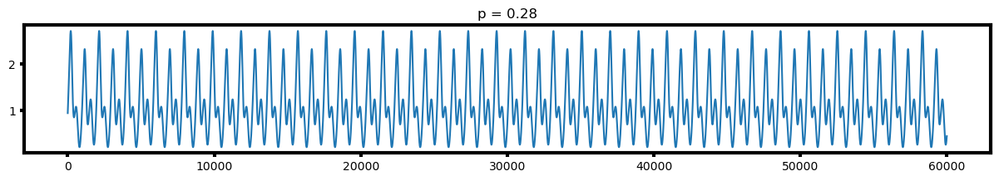

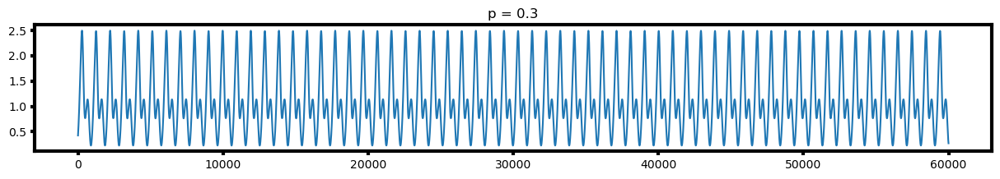

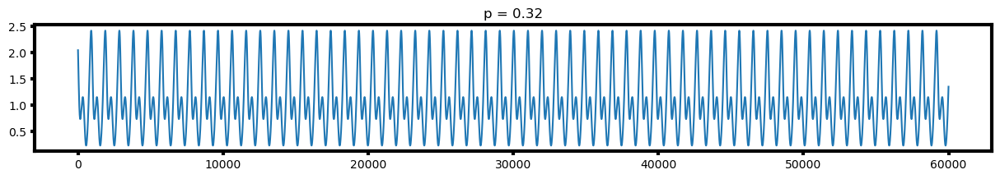

In [51]:
for p_idx in range(len_p_list):
    plt.figure(figsize = (15,2))
    plt.plot(U_train[p_idx][:,0])
    plt.title(f"p = {p_list[p_idx]}")

In [4]:
U_mean = U_data.mean(axis = 0)
U_std = U_data.std(axis = 0)
m = U_data.min(axis=0)
M = U_data.max(axis=0)
U_norm = M-m 
scale = (U_mean, U_std)

In [33]:
scale

[array([0., 0., 0., 0.]), array([1., 1., 1., 1.])]

In [4]:
scale = [None]*2
scale[0] = np.zeros(4)
scale[1] = np.ones(4)

In [ ]:
from adjoint_esn.validation import validate

#range for hyperparameters (spectral radius and input scaling)
spec_in     = 0.1   
spec_end    = 1.0 
in_scal_in  = 0.01
in_scal_end = 0.1
leak_in     = 0.1    
leak_end    = 1.0  
grid_range = [[spec_in, spec_end],[in_scal_in, in_scal_end],[leak_in, leak_end]]
# In case we want to start from a grid_search, 
# the first n_grid_x*n_grid_y points are from grid search
param_names = ['spectral_radius','input_scaling','leak_factor']
param_scales = ['uniform', 'uniform','uniform']
n_grid = [4, 4, 4]
N_washout = 50
N_val = 20000
N_transient = 10000
ESN_dict = {'reservoir_size': 1200, 
            'dimension' : dim, 
            'parameter_dimension' : 1,
            'reservoir_connectivity' : 20,
            'input_normalization': scale, 
            'input_bias' : np.array([]),
            'output_bias' : np.array([]),
            'parameter_normalization': [np.array([0.0]),np.array([1.0])],
            'r2_mode': True
            }
min_dict = validate(n_grid, grid_range, param_names, param_scales, 
    n_bo = 10, n_initial = 0, n_ensemble = 1, ESN_dict = ESN_dict, U_washout = U_washout_train, 
    U = U_train, Y = Y_train, P_washout = P_washout_train, P = P_train,
    n_folds = 5, N_init_steps = N_washout, N_fwd_steps = 1000, N_washout_steps = N_washout, N_val_steps = N_val, 
    N_transient_steps = N_transient,
    train_idx_list = [0,1,2], val_idx_list = [0,1,2], noise_std = 0)

In [5]:
from adjoint_esn.validation_v2 import validate as validate_v2

#range for hyperparameters (spectral radius and input scaling)
spec_in     = 0.1   
spec_end    = 1.0 
in_scal_in  = 0.01
in_scal_end = 0.1
leak_in     = 0.1    
leak_end    = 1.0  
grid_range = [[spec_in, spec_end],[in_scal_in, in_scal_end],[leak_in, leak_end]]
# In case we want to start from a grid_search, 
# the first n_grid_x*n_grid_y points are from grid search
param_names = ['spectral_radius','input_scaling','leak_factor']
param_scales = ['uniform','uniform','uniform']
N_washout = 100
N_val = 300
N_transient = 0
ESN_dict = {'reservoir_size': 1200, 
            'dimension' : dim, 
            'parameter_dimension' : 1,
            'reservoir_connectivity' : 20,
            'input_normalization': scale, 
            'input_bias' : np.array([]),
            'output_bias' : np.array([]),
            'parameter_normalization': [np.array([0.0]),np.array([1.0])],
            'r2_mode': False
            }
min_dict = validate_v2(grid_range,param_names,param_scales,
    n_calls = 100, n_initial_points = 25, n_ensemble = 1,
    ESN_dict = ESN_dict, tikh = 5e-8, 
    U_washout_train = U_washout_train,
    U_train = U_train,
    U_val = U_val,
    Y_train = Y_train,
    Y_val = Y_val,
    P_washout_train = P_washout_train,
    P_train = P_train,
    P_val = P_val,
    n_folds = 1,
    n_realisations=3,
    N_washout_steps = N_washout,
    N_val_steps = N_val,
    N_transient_steps = N_transient,
    train_idx_list = [0,1,2],
    val_idx_list = [0,1,2])

Running 1/1 of ensemble.
--NEW RUN-- 1
spectral_radius 0.6335601564025166
input_scaling 0.08598391737229158
leak_factor 0.8721510558604813


Realisation: 0
Val regime: 0
Val regime error: 0.057259169321984035
Val regime: 1
Val regime error: 0.016096725444547617
Val regime: 2
Val regime error: 0.07353518942639277
Realisation error: 0.1468910841929244


Realisation: 1
Val regime: 0
Val regime error: 0.19289728727927202
Val regime: 1
Val regime error: 0.0022845469053976598
Val regime: 2
Val regime error: 0.08130106725583323
Realisation error: 0.2764829014405029


Realisation: 2
Val regime: 0
Val regime error: 0.12267699396142251
Val regime: 1
Val regime error: 0.025301067673306265
Val regime: 2
Val regime error: 0.26216860598317365
Realisation error: 0.4101466676179024


Run 1 error: 0.27784021775044326


--NEW RUN-- 2
spectral_radius 0.8625265649057131
input_scaling 0.06612073271073753
leak_factor 0.44594353656343


Realisation: 0
Val regime: 0
Val regime error: 0.2857689524475506
Val re

KeyboardInterrupt: 

In [6]:
min_dict

{'params': [array([[0.21992686, 0.03007929, 0.34005623],
         [0.14178738, 0.03507191, 0.1       ],
         [0.36694275, 0.04169104, 0.2436133 ],
         [0.12296987, 0.03452612, 0.35454998],
         [0.17580627, 0.03714615, 0.1       ]])],
 'f': [array([0.00470173, 0.00484   , 0.00611389, 0.00650956, 0.00700986])]}

In [23]:
print('System dimension: ', dim)
my_ESN = ESN(reservoir_size = 1200, 
            dimension = dim, 
            parameter_dimension = 1, 
            reservoir_connectivity = 20, 
            input_scaling = 0.06, 
            spectral_radius = 0.5057,
            leak_factor = 0.385, 
            input_bias = [],
            output_bias = [],
            input_normalization = scale, 
            parameter_normalization=[np.array([0.0]),np.array([8.0])],
            r2_mode=True,
            input_seeds=[0,1,2],
            reservoir_seeds=[3,4])

System dimension:  4
Input normalization is changed, training must be done again.
Parameter normalization is changed, training must be done again.
Input scaling is set to 1, set it separately if necessary.
Input weights are rescaled with the new input scaling.
Spectral radius is set to 1, set it separately if necessary.
Reservoir weights are rescaled with the new spectral radius.


In [50]:
my_ESN.output_weights

array([[ 0.16548759, -0.01358931, -0.14549138, -0.21279677],
       [ 0.09756853, -0.01700988, -0.22793668, -0.01858579],
       [ 0.26802664,  0.0187315 ,  0.07329413, -0.11566035],
       ...,
       [-0.01924113,  0.0296316 ,  0.51805536, -0.04058278],
       [-0.01931585, -0.03229618, -0.07884474, -0.54113076],
       [ 0.01069389, -0.01577396, -0.01372338, -0.08142854]])

In [24]:
my_ESN.train(U_washout_train, U_train, Y_train, tikhonov = 5e-8, P_washout=P_washout_train, P_train=P_train, train_idx_list=[0,1,2])

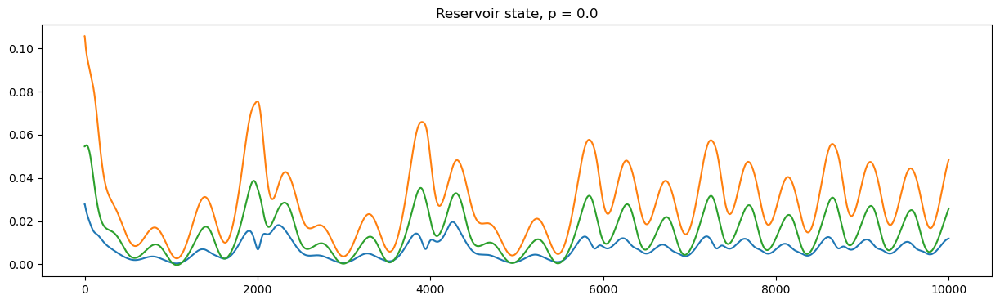

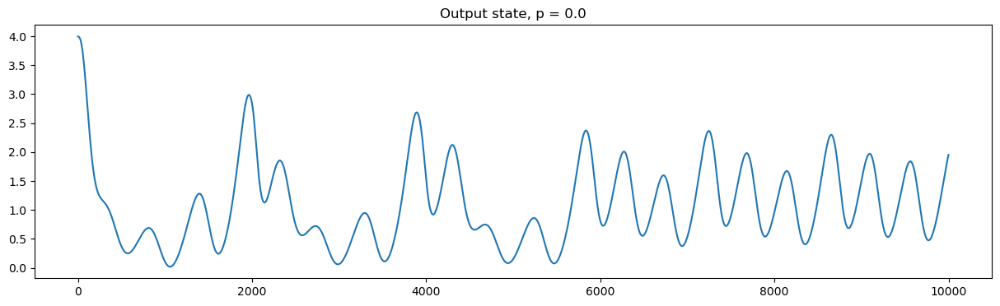

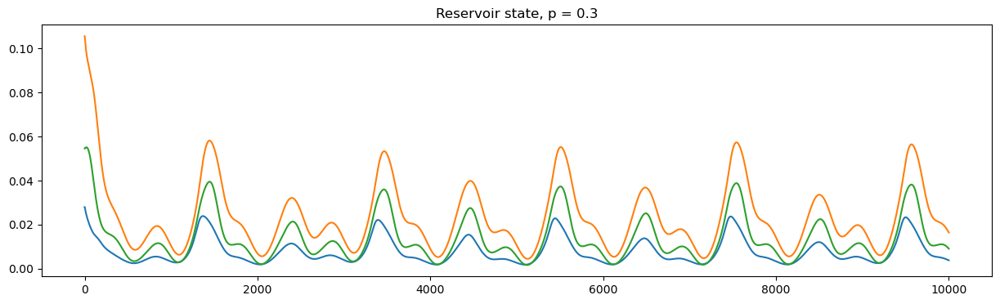

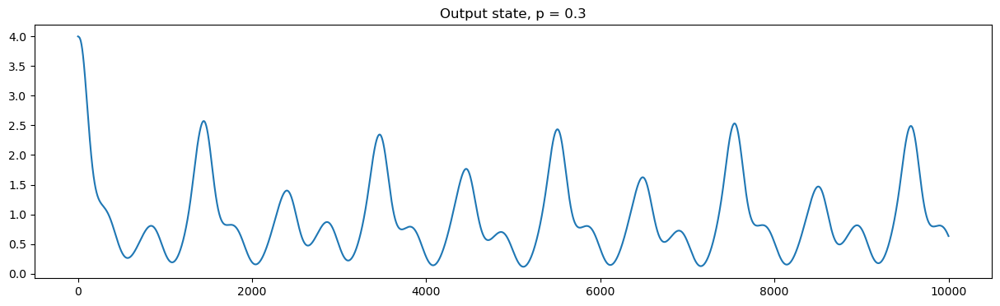

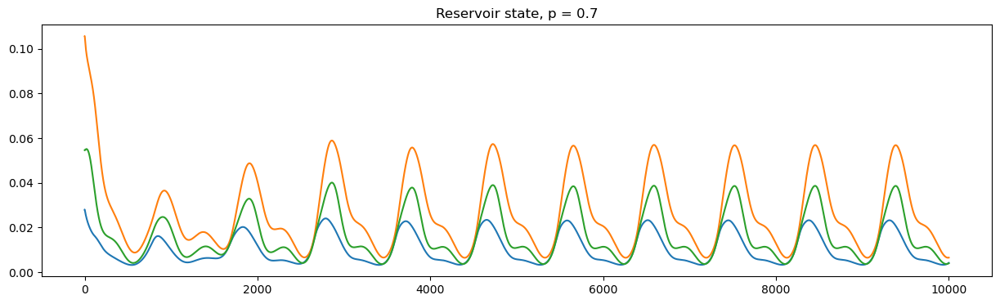

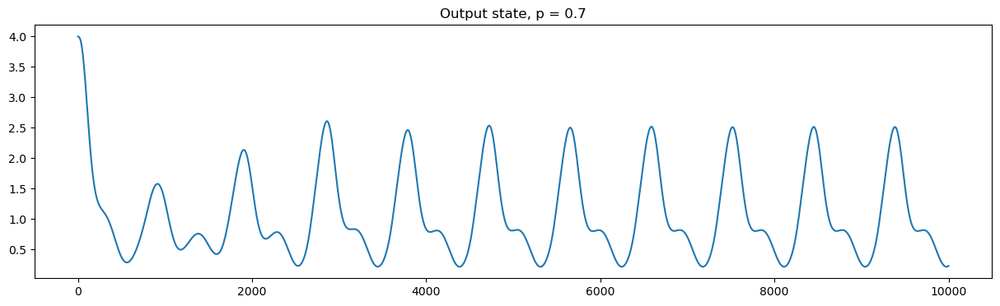

In [35]:
for pp in [0.0,0.3,0.7]:
    U_init = np.array([4.0,0.0,0.0,0.1])
    U_washout_test = np.tile(U_init, (400,1))
    P_washout_test = 0.3*np.ones((400,1))
    x0 = my_ESN.run_washout(U_washout = U_washout_test, P_washout=P_washout_test)
    my_X0, my_Y0 = my_ESN.closed_loop(x0 = x0, N_t = 10000, P = pp*np.ones((10000,1)))
    plt.figure(figsize = (15,4))
    plt.plot(my_X0[:,0])
    plt.plot(my_X0[:,1])
    plt.plot(my_X0[:,2])
    plt.title(f"Reservoir state, p = {pp}")

    plt.figure(figsize = (15,4))
    plt.plot(my_Y0[:,0])
    plt.title(f"Output state, p = {pp}")

In [8]:
def L2_error(y, y_pred):
    return np.linalg.norm(y-y_pred, 'fro')

def log10_error(y, y_pred):
    return np.log10(np.mean((y-y_pred)**2))

def col_mse(y_true, y_pred):
    return np.mean((y_true-y_pred)**2, axis = 0)

def mse(y_true, y_pred):
    return np.sum(col_mse(y_true, y_pred))

def rmse(y_true, y_pred):
    return np.sum(np.sqrt(col_mse(y_true, y_pred)))

def nrmse(y_true, y_pred):
    col_maxmin = np.max(y_true, axis=0)-np.min(y_true, axis=0)
    col_rmse = np.sqrt(col_mse(y_true, y_pred))
    return np.sum(col_rmse/col_maxmin)

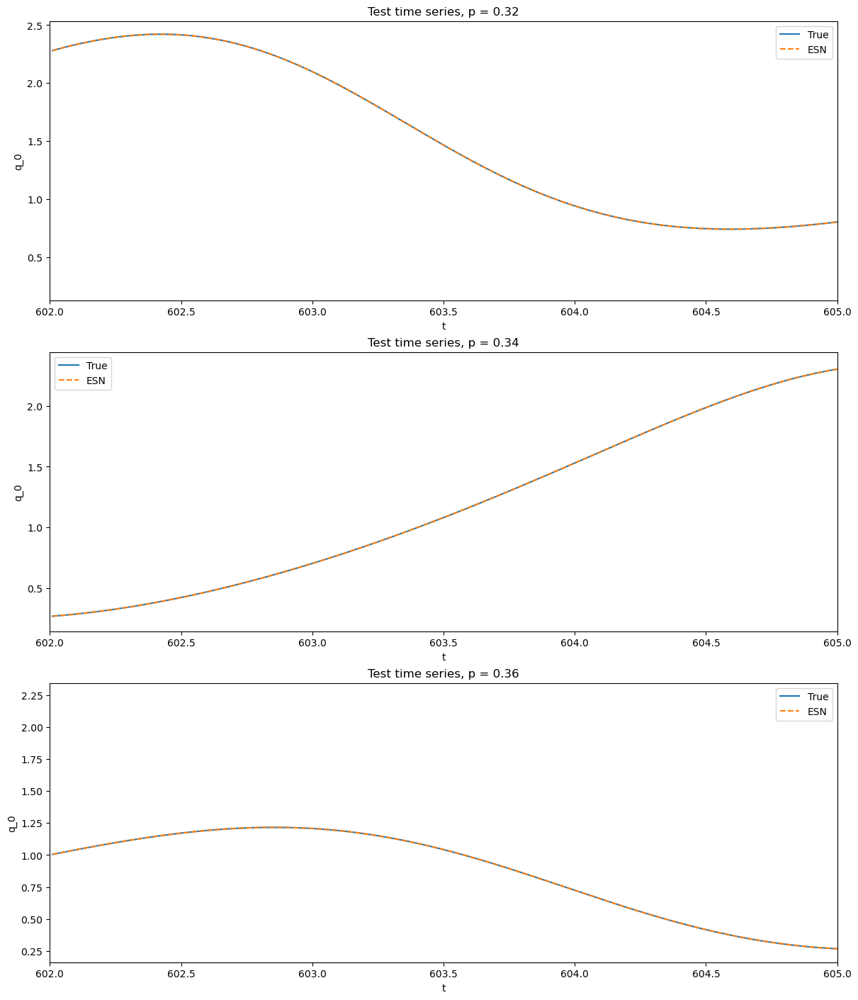

In [45]:
Y_pred_val = [None]*len_p_list
plt.figure(figsize=(12,14), constrained_layout = True)
for p_idx in range(len_p_list):
    #X_train = my_ESN.open_loop_with_washout(U_washout = U_washout_train[p_idx], U = U_train[p_idx], 
    #                                        P_washout=P_washout_train[p_idx], P = P_train[p_idx])
    #_, Y_pred_val_ = my_ESN.closed_loop_with(x0 = X_train[-1], N_t = len(U_val[p_idx]), P = P_val[p_idx])
    _, Y_pred_val_ = my_ESN.closed_loop_with_washout(U_washout = U_washout_val[p_idx], N_t = len(U_val[p_idx]), P_washout=P_washout_val[p_idx], P = P_val[p_idx])
    Y_pred_val[p_idx]= Y_pred_val_[1:,:]
    plt.subplot(len_p_list,1,p_idx+1)
    for j in range(np.minimum(dim,1)):
        #plt.plot(t_val, Y_val[:,j]-Y_pred_val[:,j])
        plt.plot(t_val[p_idx][:], Y_val[p_idx][:,j])
        plt.plot(t_val[p_idx][:], Y_pred_val[p_idx][:,j],'--')
        plt.title(f"Test time series, p = {p_list[p_idx]}")
        plt.xlabel("t")
        plt.ylabel(f"q_{j}")
        plt.legend(["True", "ESN"])
        plt.xlim([602,605])

Train error:  0.3770292430909008
Validation error:  0.20288392793572074
Train error:  0.04039523575122952
Validation error:  0.0222142978159662
Train error:  0.3185868820033265
Validation error:  0.1776787081367201


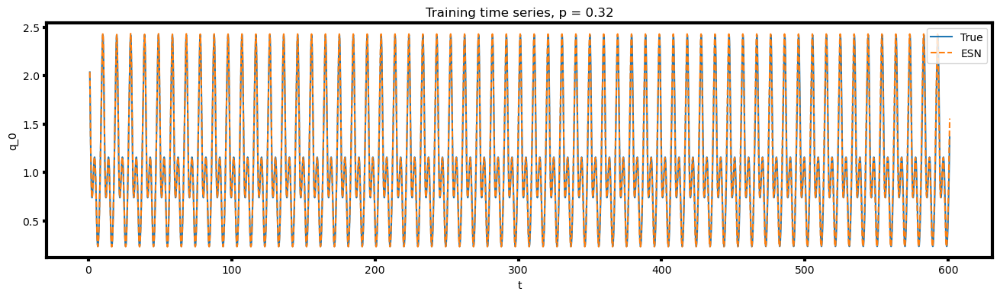

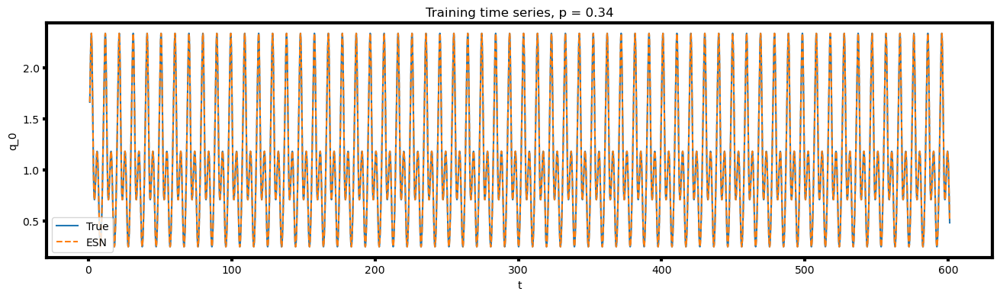

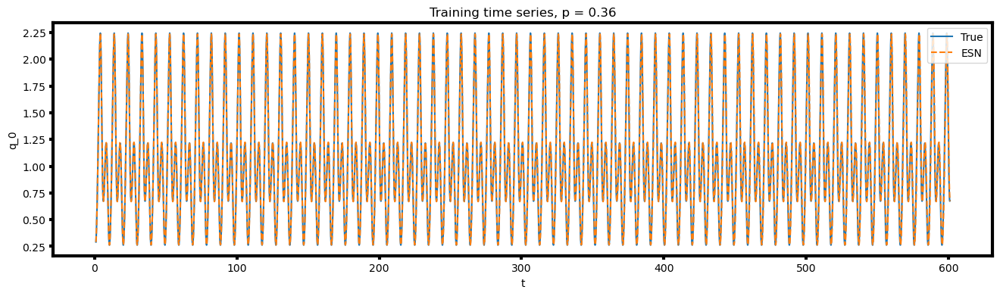

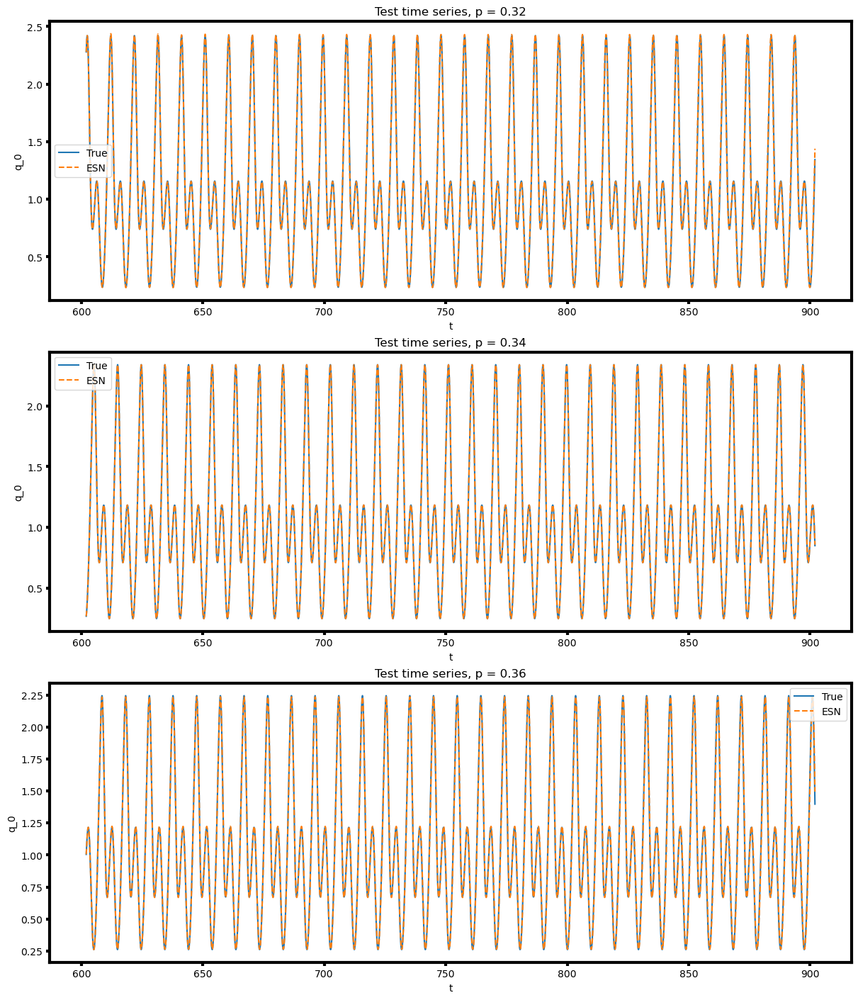

In [53]:
Y_pred_train = [None]*len_p_list
for p_idx in range(len_p_list):
    _, Y_pred_train_ = my_ESN.closed_loop_with_washout(U_washout = U_washout_train[p_idx], N_t = len(U_train[p_idx]), P_washout=P_washout_train[p_idx], P = P_train[p_idx])
    Y_pred_train[p_idx] = Y_pred_train_[1:,:]
    for j in range(np.minimum(dim,1)):
        plt.figure(figsize=(16,4))
        plt.plot(t_train[p_idx], Y_train[p_idx][:,j])
        plt.plot(t_train[p_idx], Y_pred_train[p_idx][:,j],'--')
        plt.title(f"Training time series, p = {p_list[p_idx]}")
        plt.xlabel("t")
        plt.ylabel(f"q_{j}")
        plt.legend(["True", "ESN"])

Y_pred_val = [None]*len_p_list
plt.figure(figsize=(12,14), constrained_layout = True)
for p_idx in range(len_p_list):
    _, Y_pred_val_ = my_ESN.closed_loop_with_washout(U_washout = U_washout_val[p_idx], N_t = len(U_val[p_idx]), P_washout=P_washout_val[p_idx], P = P_val[p_idx])
    Y_pred_val[p_idx] = Y_pred_val_[1:,:]
    plt.subplot(len_p_list,1,p_idx+1)
    for j in range(np.minimum(dim,1)):
        #plt.plot(t_val, Y_val[:,j]-Y_pred_val[:,j])
        plt.plot(t_val[p_idx][:], Y_val[p_idx][:,j])
        plt.plot(t_val[p_idx][:], Y_pred_val[p_idx][:,j],'--')
        plt.title(f"Test time series, p = {p_list[p_idx]}")
        plt.xlabel("t")
        plt.ylabel(f"q_{j}")
        plt.legend(["True", "ESN"])

# calculate error
for p_idx in range(len_p_list):
    train_error = rmse(Y_train[p_idx][10000:], Y_pred_train[p_idx][10000:])
    val_error = rmse(Y_val[p_idx][10000:], Y_pred_val[p_idx][10000:])
    print("Train error: ", train_error)
    print("Validation error: ", val_error)

Val regime: 0
Val regime error: 0.0006554231278100094
Val regime: 1
Val regime error: 0.0007838280742602047
Val regime: 2
Val regime error: 0.0005462757068729255


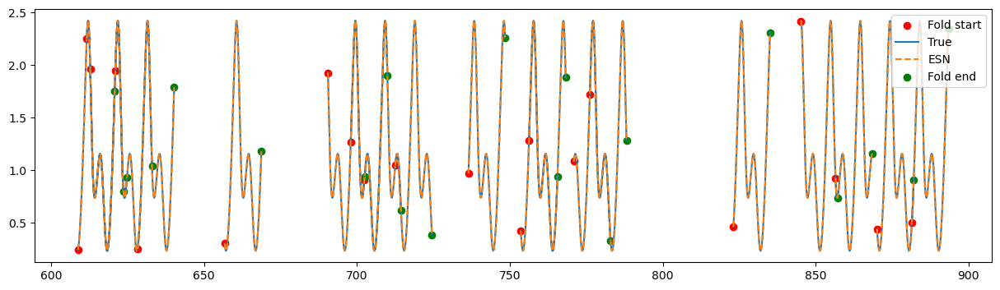

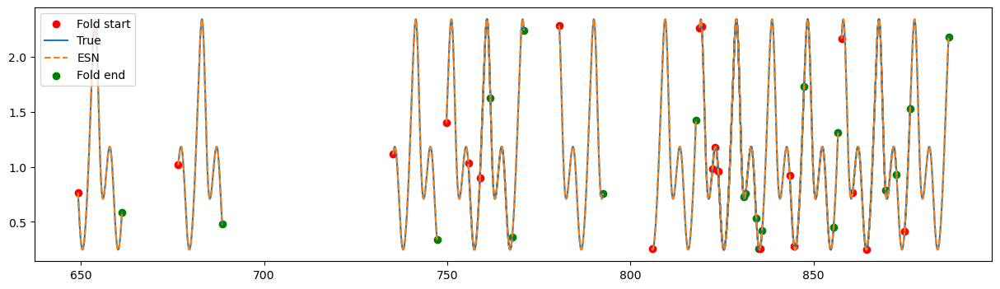

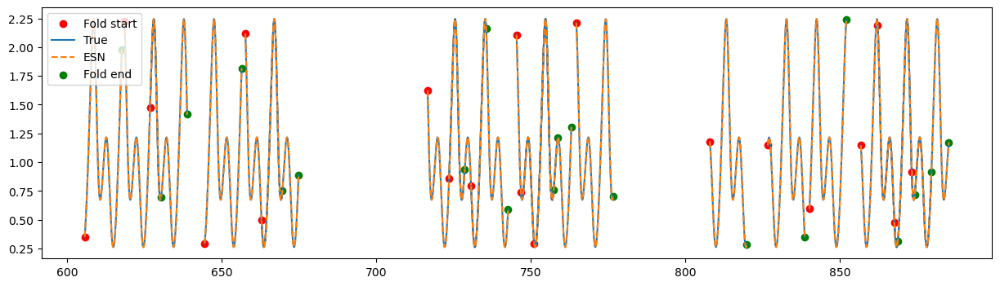

In [14]:
val_idx_list = [0,1,2]
n_folds = 20
N_washout = 50
N_val = 1200
N_transient = 200
for val_idx in val_idx_list:
    print("Val regime:", val_idx)
    #n_folds_max = int(np.floor((len(U_val[val_idx])-N_washout)/N_val))
    #n_folds_final = np.min((n_folds_max, n_folds))
    # validate with different folds
    fold_error = np.zeros(n_folds)
    plt.figure(figsize=(15,4))
    for fold in range(n_folds):
        # select washout and validation
        #start_step = fold * (N_val-N_washout)
        start_step = np.random.randint(len(U_val[val_idx])-(N_washout+N_val))
        #start_step = 0
        #print(start_step)
        U_washout_fold = U_val[val_idx][start_step : start_step+N_washout].copy()
        P_washout_fold = P_val[val_idx][start_step : start_step+N_washout].copy()
        Y_val_fold = Y_val[val_idx][start_step+N_washout : start_step+N_washout+N_val].copy()
        P_val_fold = P_val[val_idx][start_step+N_washout : start_step+N_washout+N_val].copy()

        # predict output validation in closed-loop
        _, Y_val_pred = my_ESN.closed_loop_with_washout(U_washout=U_washout_fold,
                                                        N_t=N_val,
                                                        P_washout=P_washout_fold,
                                                        P=P_val_fold)
        Y_val_pred = Y_val_pred[1:, :]

        # compute error
        fold_error[fold] = rmse(Y_val_fold[N_transient:], Y_val_pred[N_transient:])
        #print("Fold:", fold,", fold error: ", fold_error[fold])

        t_val_fold = t_val[val_idx][start_step+N_washout : start_step+N_washout+N_val]
        plt.scatter(t_val_fold[0],Y_val_fold[0,0], color = "red")
        plt.plot(t_val_fold,Y_val_fold[:,0],color='tab:blue')
        plt.plot(t_val_fold,Y_val_pred[:,0],'--',color="tab:orange")
        plt.scatter(t_val_fold[-1],Y_val_fold[-1,0], color="green")
        plt.legend(["Fold start", "True", "ESN","Fold end"])
    # average over intervals
    val_error = np.mean(fold_error)
    print("Val regime error:", val_error)

Running solver.
Train error:  3.662442550681715
Validation error:  3.8142962090295875
Running solver.
Train error:  3.5371857793820656
Validation error:  3.555807464427712
Running solver.
Train error:  3.3511469817910196
Validation error:  2.5841181595943907
Running solver.
Train error:  2.762903908999642
Validation error:  2.6273820303425257
Running solver.
Train error:  2.324186639030008
Validation error:  2.053468007531757
Running solver.
Train error:  1.2264192599735124
Validation error:  0.7936945144111273
Running solver.
Train error:  0.6283579619304593
Validation error:  0.28395036740389096
Running solver.
Train error:  0.040002588049765524
Validation error:  0.019099820948510548
Running solver.
Train error:  0.01631472063258378
Validation error:  0.007850341543484353
Running solver.
Train error:  1.2201664626792597
Validation error:  0.622582254215615
Running solver.


C:\Users\egeoz\AppData\Local\Temp\ipykernel_5584\1870856348.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,4), constrained_layout = True)


Train error:  2.571163391974632
Validation error:  1.723519322026157
Running solver.
Train error:  2.0679042554472225
Validation error:  2.3627966425393847
Running solver.
Train error:  1.9227986008353244
Validation error:  1.7633692041795828
Running solver.
Train error:  0.07063346672047079
Validation error:  0.07357697874512807
Running solver.
Train error:  0.07804447520248015
Validation error:  0.08111626432376134


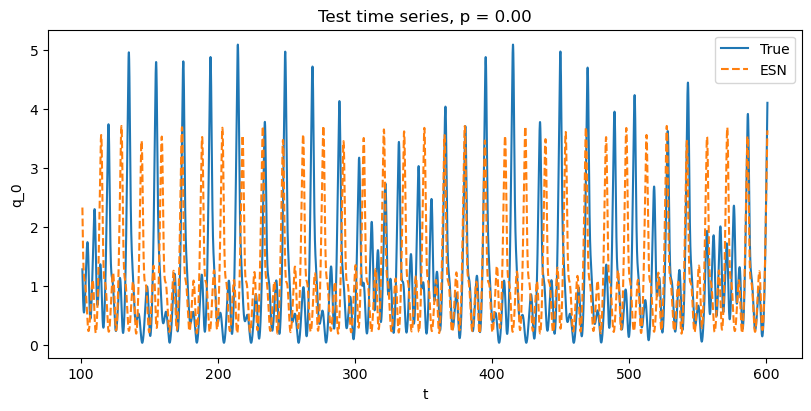

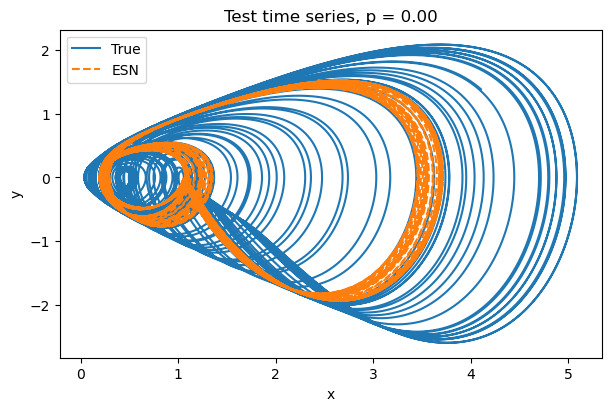

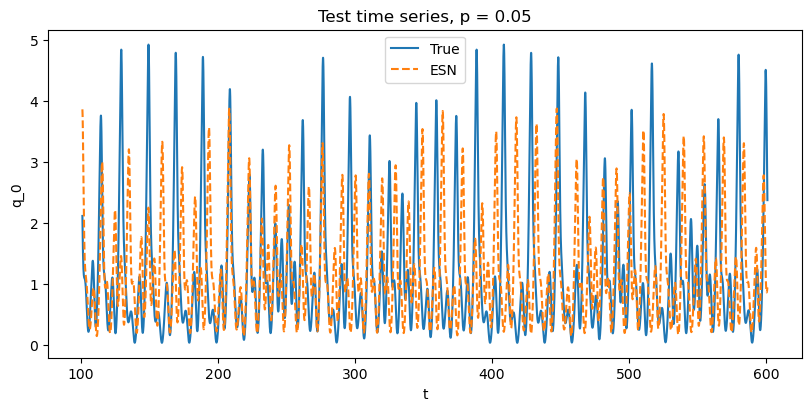

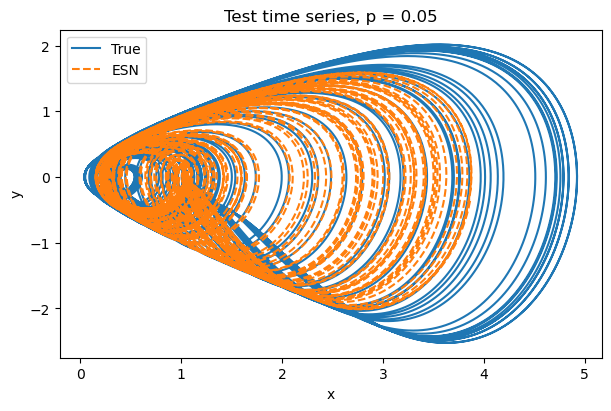

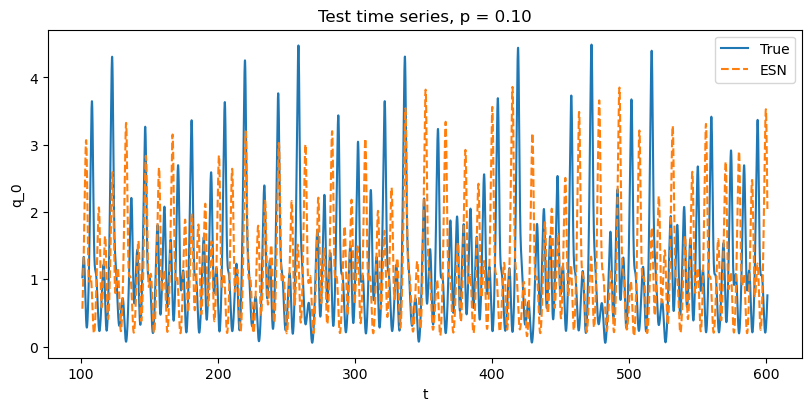

...

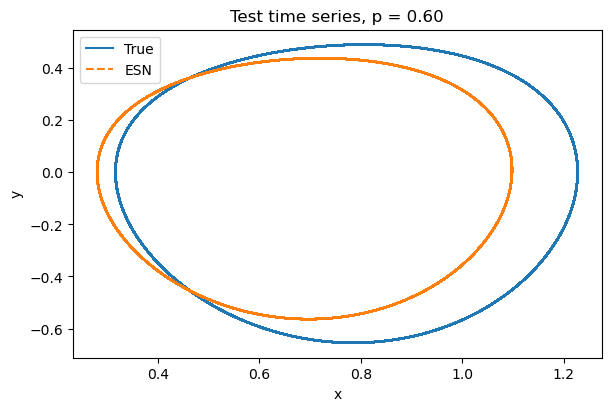

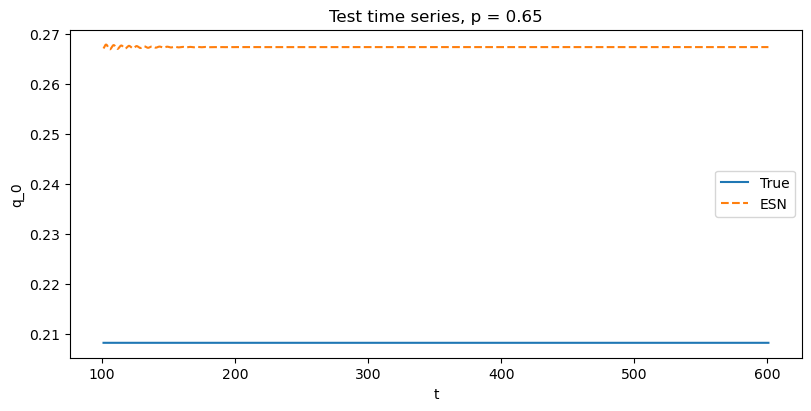

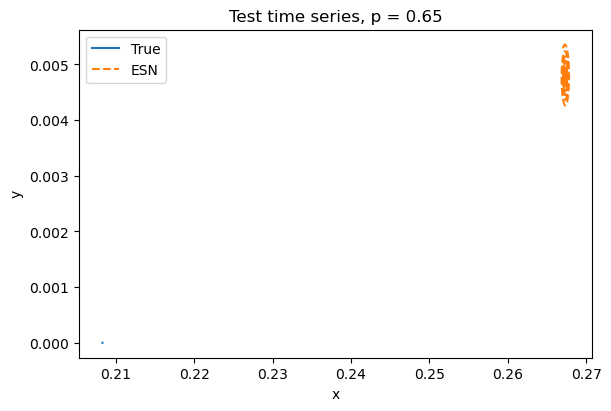

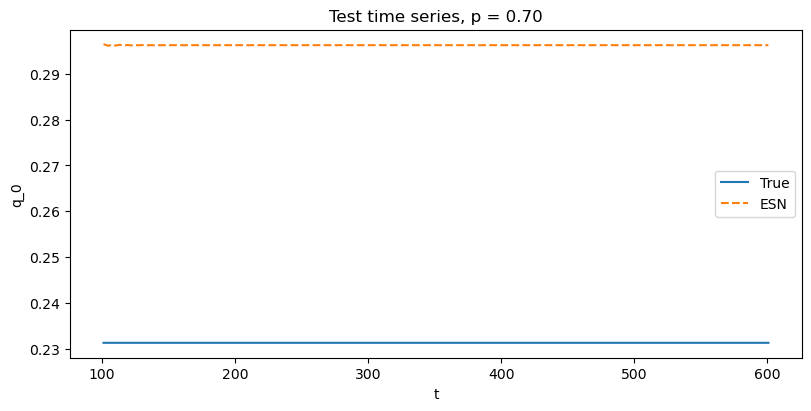

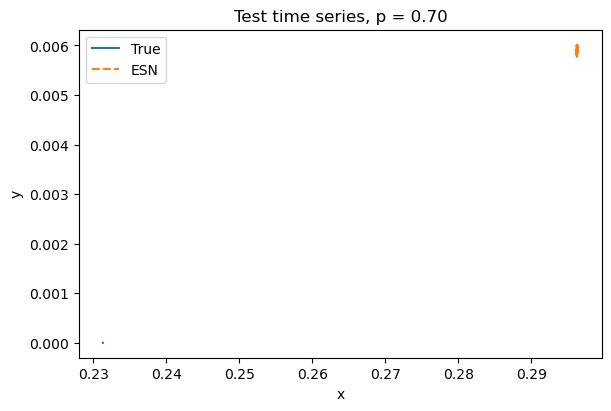

In [14]:
pp_test_list = np.arange(0.0,0.75,0.05)
#plt.figure(figsize=(12,14), constrained_layout = True)
for test_idx, pp_test in enumerate(pp_test_list): 
    U_washout_test, U_test, Y_test, t_test, U_washout_testval, U_testval, Y_testval, t_testval, U_data_test = load_data_sys(pp_test)
    P_test = pp_test*np.ones((len(U_test),1))
    P_testval = pp_test*np.ones((len(U_testval),1))
    P_washout_test = pp_test*np.ones((len(U_washout_test),1))
    P_washout_testval = pp_test*np.ones((len(U_washout_testval),1))
    X_pred_test, Y_pred_test = my_ESN.closed_loop_with_washout(U_washout = U_washout_test, N_t = len(U_test), P_washout=P_washout_test, P = P_test)
    Y_pred_test = Y_pred_test[1:,:]

    X_pred_testval, Y_pred_testval = my_ESN.closed_loop_with_washout(U_washout = U_washout_testval, N_t = len(U_testval), P_washout=P_washout_testval, P = P_testval)
    Y_pred_testval = Y_pred_testval[1:,:]
    for j in range(1):
        plt.figure(figsize=(8,4), constrained_layout = True)
        plt.plot(t_test[10000:], Y_test[10000:,j])
        plt.plot(t_test[10000:], Y_pred_test[10000:,j],'--')
        plt.title(f"Test time series, p = {pp_test:4.2f}")
        plt.xlabel("t")
        plt.ylabel(f"q_{j}")
        plt.legend(["True", "ESN"])

    plt.figure(figsize=(6,4), constrained_layout = True)
    plt.plot(Y_test[10000:,0], Y_test[10000:,1])
    plt.plot(Y_pred_test[10000:,0], Y_pred_test[10000:,1],'--')
    plt.title(f"Test time series, p = {pp_test:4.2f}")
    plt.xlabel("x")
    plt.ylabel(f"y")
    plt.legend(["True", "ESN"])

    test_error = rmse(Y_test, Y_pred_test)
    testval_error = rmse(Y_testval, Y_pred_testval)
    print("Train error: ", test_error)
    print("Validation error: ", testval_error)

In [25]:
# #--------prediction for a new parameter--------------------------------------------------------------------
par = np.arange(0,0.7,0.02)     # new parameter
N_washout_test = 500
N_test = 30000

local_maxx=np.zeros((len(par),200))
local_maxx_true=np.zeros((len(par),200))
print('prediction started')
for ind_par in range(len(par)):
    
    print(par[ind_par])
    _, _, Y_data, t, _, _, _, _, _ = load_data_sys(par[ind_par])
    true_data = Y_data[10000:N_test,0]
    U_init = np.array([4.0,0.0,0.0,0.1])
    U_washout_test = np.tile(U_init, (N_washout_test,1))
    P_test = par[ind_par]*np.ones((N_test,1))
    P_washout_test = par[ind_par]*np.ones((N_washout_test,1))
    _, Y_pred_data = my_ESN.closed_loop_with_washout(U_washout = U_washout_test, N_t = N_test-1, P_washout=P_washout_test, P = P_test)
    pred_data = Y_pred_data[10000:,0]
    
    aa = []
    bb = []
    for ind_pred_data in range(len(pred_data)-2):
            
        if pred_data[ind_pred_data+2]-pred_data[ind_pred_data+1] < 0 and pred_data[ind_pred_data+1]-pred_data[ind_pred_data] > 0:
            aa = np.append(aa, pred_data[ind_pred_data+1])
            
    if pred_data[-2]-pred_data[-3] < 10**-3:
        aa = np.append(aa,pred_data[-2])
                    
    for ind_aa in range(len(aa)):
        local_maxx[ind_par,ind_aa] = aa[ind_aa] 

    for ind_true_data in range(len(true_data)-2):
            
        if true_data[ind_true_data+2]-true_data[ind_true_data+1] < 0 and true_data[ind_true_data+1]-true_data[ind_true_data] > 0:
            bb = np.append(bb, true_data[ind_true_data+1])
            
    if true_data[-2]-true_data[-3] < 10**-3:
        bb = np.append(bb,true_data[-2])
                          
    for ind_bb in range(len(bb)):
        local_maxx_true[ind_par,ind_bb] = bb[ind_bb] 

prediction started
0.0
Running solver.
0.02
Running solver.
0.04
Running solver.
0.06
Running solver.
0.08
Running solver.
0.1
Running solver.
0.12
Running solver.
0.14
Running solver.
0.16
Running solver.
0.18
Running solver.
0.2
Running solver.
0.22
Running solver.
0.24
Running solver.
0.26
Running solver.
0.28
Running solver.
0.3
Running solver.
0.32
Running solver.
0.34
Running solver.
0.36
Running solver.
0.38
Running solver.
0.4
Running solver.
0.42
Running solver.
0.44
Running solver.
0.46
Running solver.
0.48
Running solver.
0.5
Running solver.
0.52
Running solver.
0.54
Running solver.
0.56
Running solver.
0.58
Running solver.
0.6
Running solver.
0.62
Running solver.
0.64
Running solver.
0.66
Running solver.
0.68
Running solver.


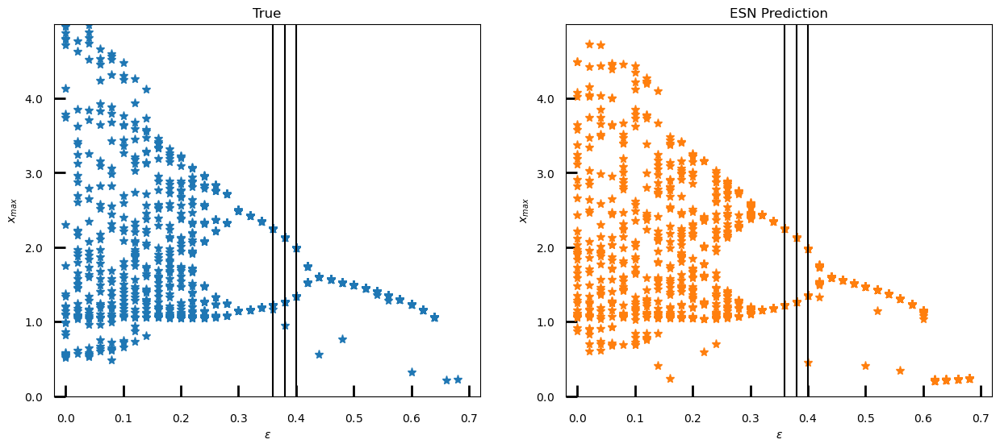

In [26]:
par = np.arange(0,0.7,0.02)    
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

for ind_par in range(len(par)):
 
    plot_local_maxx=local_maxx_true[ind_par,np.where(local_maxx_true[ind_par,:]!=0)]  
    ax[0].plot(par[ind_par]*np.ones(len(plot_local_maxx)), plot_local_maxx, color='tab:blue', marker='*', linestyle='None',
                                        linewidth=3, markersize=8)
    
ax[0].vlines(x = np.array(p_list), ymin = 0, ymax=5, color = "black")

ax[0].set_xticks([0,.1,.2,.3,.4,.5,.6,.7])
ax[0].set_xticklabels([r'$0.0$',r'$0.1$', r'$0.2$',
                        r'$0.3$',r'$0.4$',r'$0.5$',r'$0.6$',r'$0.7$'])

ax[0].set_yticks([0,1,2,3,4])
ax[0].set_yticklabels([r'$0.0$',r'$1.0$', r'$2.0$',
                        r'$3.0$',r'$4.0$'])

ax[0].tick_params( direction='in', length=20,width=8,pad=16)
    
ax[0].set_xlim([-0.02,0.72])
ax[0].set_ylim([0,5.0])
ax[0].set_xlabel(r'$\epsilon$')
ax[0].set_ylabel(r'$x_{max}$')
ax[0].tick_params(axis="x", direction='in', length=10, width=2, pad=15)
ax[0].tick_params(axis="y", direction='in', length=10, width=2, pad=10)
ax[0].set_title("True")

for ind_par in range(len(par)):
 
    plot_local_maxx=local_maxx[ind_par,np.where(local_maxx[ind_par,:]!=0)]  
    ax[1].plot(par[ind_par]*np.ones(len(plot_local_maxx)), plot_local_maxx, color='tab:orange', marker='*', linestyle='None',
                                        linewidth=3, markersize=8)
    
ax[1].vlines(x = np.array(p_list), ymin = 0, ymax=5, color = "black")

ax[1].set_xticks([0,.1,.2,.3,.4,.5,.6,.7])
ax[1].set_xticklabels([r'$0.0$',r'$0.1$', r'$0.2$',
                    r'$0.3$',r'$0.4$',r'$0.5$',r'$0.6$',r'$0.7$'])

ax[1].set_yticks([0,1,2,3,4])
ax[1].set_yticklabels([r'$0.0$',r'$1.0$', r'$2.0$',
                        r'$3.0$',r'$4.0$'])

ax[1].tick_params(direction='in', length=20,width=8,pad=16)
    
ax[1].set_xlim([-0.02,0.72])
ax[1].set_ylim([0,5.0])
ax[1].set_xlabel(r'$\epsilon$')
ax[1].set_ylabel(r'$x_{max}$')
ax[1].tick_params(axis="x", direction='in', length=10, width=2, pad=15)
ax[1].tick_params(axis="y", direction='in', length=10, width=2, pad=10)
ax[1].set_title("ESN Prediction")

fig.savefig("roy_scale_8.png")

0.0
0.05
0.1
0.15000000000000002
0.2
0.25
0.30000000000000004
0.35000000000000003
0.4
0.45
0.5


C:\Users\egeoz\AppData\Local\Temp\ipykernel_14848\1173683597.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,4), constrained_layout = True)


0.55
0.6000000000000001
0.65
0.7000000000000001


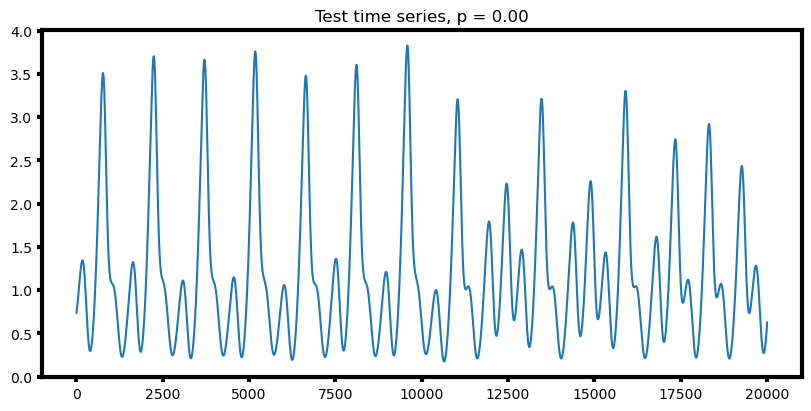

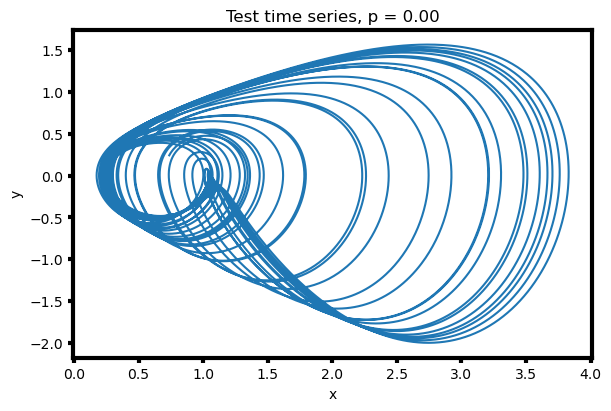

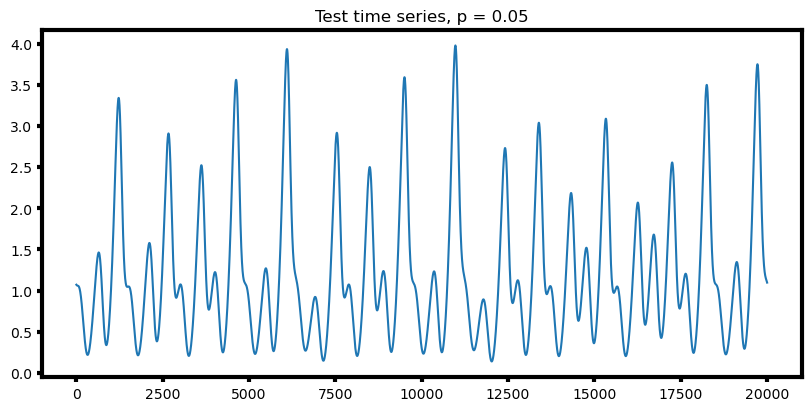

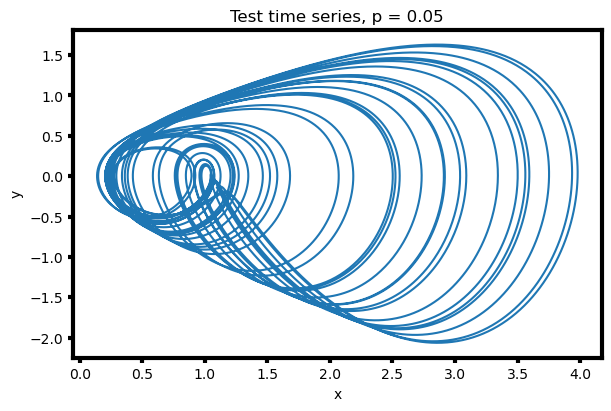

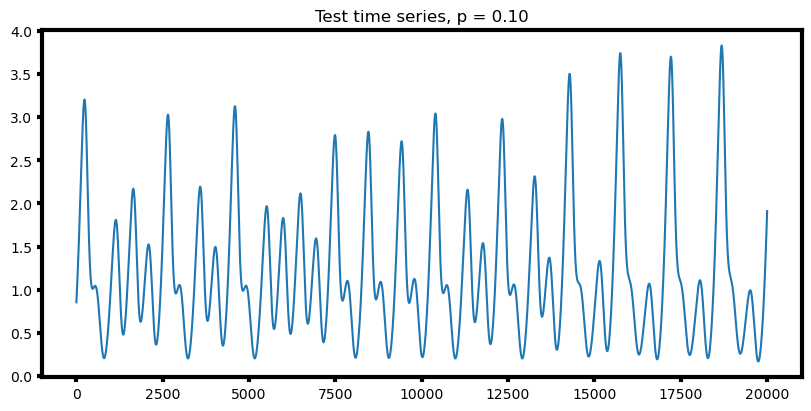

...

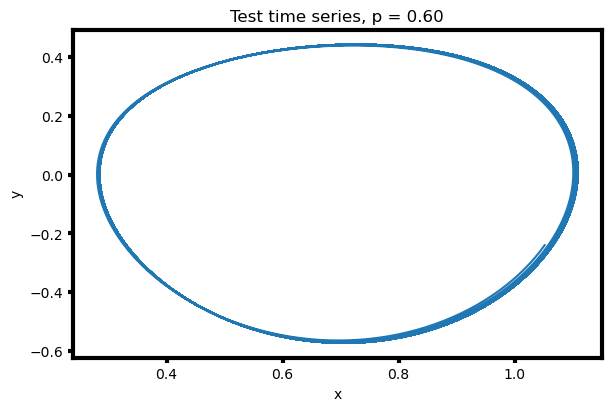

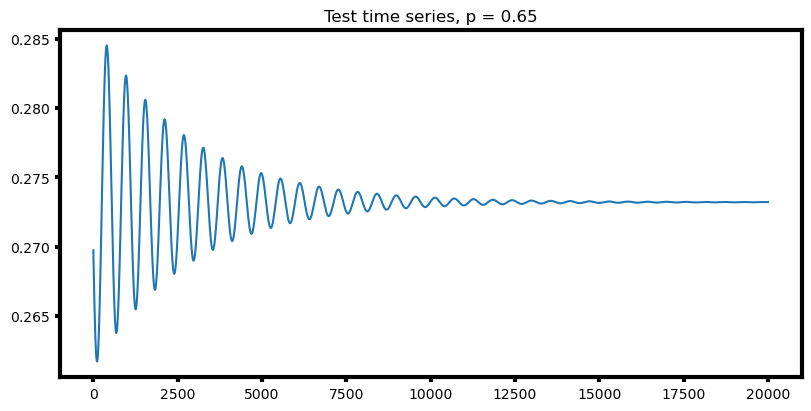

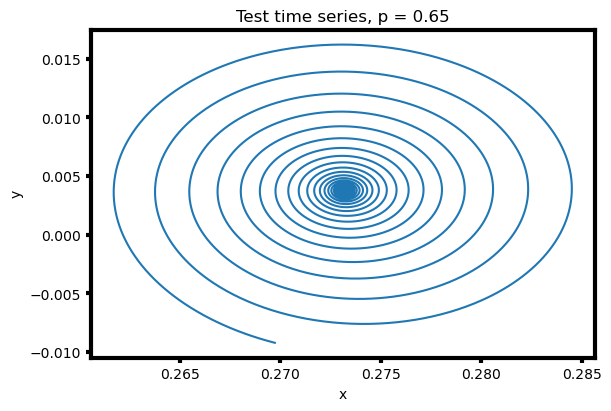

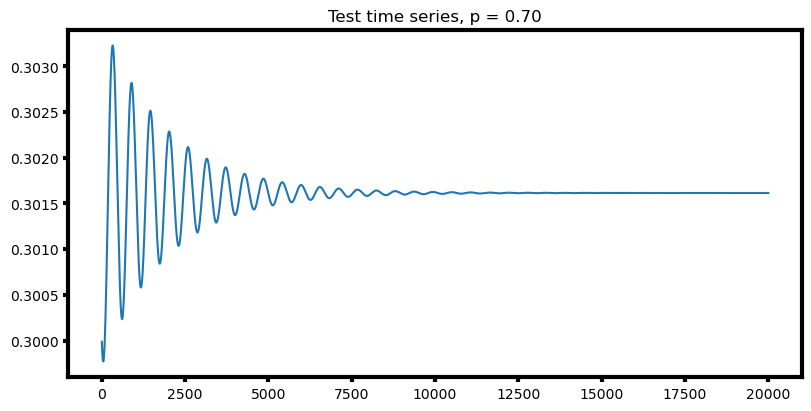

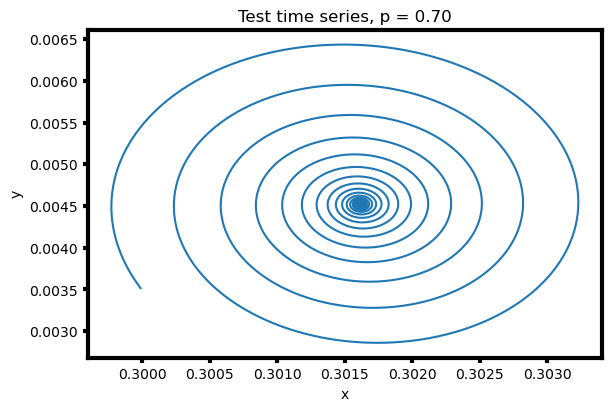

In [34]:
# #--------prediction for a new parameter--------------------------------------------------------------------
par = np.arange(0,0.75,0.05)     # new parameter
N_washout_test = 500
N_test = 30000
for ind_par in range(len(par)):
    
    print(par[ind_par])
    U_init = np.array([4.0,0.0,0.0,0.1])
    U_washout_test = np.tile(U_init, (N_washout_test,1))
    P_test = par[ind_par]*np.ones((N_test,1))
    P_washout_test = par[ind_par]*np.ones((N_washout_test,1))
    _, Y_pred_data = my_ESN.closed_loop_with_washout(U_washout = U_washout_test, N_t = N_test-1, P_washout=P_washout_test, P = P_test)
    pred_data = Y_pred_data[10000:,:]
    plt.figure(figsize=(8,4), constrained_layout = True)
    plt.plot(pred_data[:,0])
    plt.title(f"Test time series, p = {par[ind_par]:4.2f}")

    plt.figure(figsize=(6,4), constrained_layout = True)
    plt.plot(pred_data[:,0],pred_data[:,1])
    plt.title(f"Test time series, p = {par[ind_par]:4.2f}")
    plt.xlabel("x")
    plt.ylabel(f"y")

In [20]:
def run_sys(my_sys):
    dt = 1e-2

    t_transient_len = 1000
    t_washout_len = 0.5
    t_sim_len = 2000

    t_sim = np.arange(0,t_sim_len,dt)
    u0 = np.array([4.0,0.0,0.0,0.1])
    U_sim = solve_ode.integrate(my_sys, u0, t_sim)

    N_transient = int(np.round(t_transient_len/dt))
    N_washout_data = int(np.round(t_washout_len/dt))
    U_sim = U_sim[N_transient:,:]
    t_sim = t_sim[N_transient:]-t_sim[N_transient]

    U_bar = U_sim[N_washout_data:,:]
    t_bar = t_sim[N_washout_data:]-t_sim[N_washout_data]

    # upsample
    U = U_sim
    t = t_sim

    # separate into washout, train, val
    N_washout = int(np.round(t_washout_len/dt))

    U_washout = U[0:N_washout,:]
    U_grad = U[N_washout:,:]
    t_grad = t[N_washout:]-t[N_washout]

    P_washout = my_sys.epsilon*np.ones((len(U_washout),1))
    P_grad = my_sys.epsilon*np.ones((len(U_grad),1))
    return U_bar, t_bar, U_washout, U_grad, t_grad, P_washout, P_grad

def run_true_grad(my_sys, t_bar, y_bar): 
    # Calculate numerically
    # Find perturbed solutions (in p)
    h = 1e-5 # perturbation on the parameter
    J = 1/4*np.mean(np.sum(y_bar**2, axis = 1))
    
    # left solution with beta = beta-h
    my_sys_left = MultiStable(alpha=-0.02,beta=0.15,k=1.0,epsilon=my_sys.epsilon-h)
    y_bar_sys_left = solve_ode.integrate(my_sys_left, y_bar[0,:], t_bar)
    J_left = 1/4*np.mean(np.sum(y_bar_sys_left**2, axis = 1))
        
    # right solution with beta = beta+h
    my_sys_right = MultiStable(alpha=-0.02,beta=0.15,k=1.0,epsilon=my_sys.epsilon+h)
    y_bar_sys_right = solve_ode.integrate(my_sys_right, y_bar[0,:], t_bar)
    J_right = 1/4*np.mean(np.sum(y_bar_sys_right**2, axis = 1))

    dJ_dp_num = (J_right-J_left)/(2*h)
    print("J = ", J)
    print("J left = ",J_left)
    print("J right = ",J_right)

    print("dJ/dp numerical = ", dJ_dp_num)

    return dJ_dp_num

def run_esn_grad(my_ESN, N, X_pred_grad, Y_pred_grad, P_grad):
    h = 1e-5
    J = 1/4*np.mean(np.sum(Y_pred_grad[:,0:20]**2, axis = 1))
    
    dJ_dp_num = np.zeros((my_ESN.N_param_dim))
    for i in range(my_ESN.N_param_dim):
        P_left = P_grad.copy()
        P_left[:,i] -= h
        P_right = P_grad.copy()
        P_right[:,i] += h
        X_left, Y_left = my_ESN.closed_loop(X_pred_grad[0,:], N-1, P_left)
        X_right, Y_right =  my_ESN.closed_loop(X_pred_grad[0,:], N-1, P_right)
        J_left = 1/4*np.mean(np.sum(Y_left[:,0:20]**2, axis = 1))
        J_right = 1/4*np.mean(np.sum(Y_right[:,0:20]**2, axis = 1))
        dJ_dp_num[i] = (J_right-J_left)/(2*h)
    print("J ESN = ", J)
    print("J left ESN = ",J_left)
    print("J right ESN = ",J_right)

    print("dJ/dp numerical ESN = ", dJ_dp_num)
    return dJ_dp_num

In [21]:
my_p_list = np.arange(0.0,0.7,0.02)
dJ_dp_num_true = len(my_p_list)*[None]
dJ_dp_num_esn = len(my_p_list)*[None]

for p_idx, my_p in enumerate(my_p_list):
    print("epsilon = ", my_p)

    beta_name = f'{my_p:.2f}'
    beta_name = beta_name.replace(".","_")
    sim_str = f"data_new/rijke_kings_poly_beta_{beta_name}_tau_0_20.h5"

    my_sys = MultiStable(alpha=-0.02,beta=0.15,k=1.0,epsilon=my_p)
    
    U_bar,t_bar,U_washout,U_grad,t_grad,P_washout,P_grad = run_sys(my_sys)
    dJ_dp_num_true[p_idx] = run_true_grad(my_sys, t_bar, U_bar)
    X_pred_grad, Y_pred_grad = my_ESN.closed_loop_with_washout(U_washout = U_washout, N_t = len(U_grad)-1, P_washout=P_washout, P = P_grad)
    N = len(U_grad)
    dJ_dp_num_esn[p_idx] = run_esn_grad(my_ESN, N, X_pred_grad, Y_pred_grad, P_grad)
    
dJ_dp_num_true = np.array([item for item in dJ_dp_num_true])
dJ_dp_num_esn = np.array([item for sublist in dJ_dp_num_esn for item in sublist])

epsilon =  0.0
Running solver.
Running solver.
Running solver.
J =  1.0341498801687574
J left =  1.0481671049998833
J right =  1.0481671049998833
dJ/dp numerical =  0.0
J ESN =  0.9329294526660007
J left ESN =  0.9328398522925826
J right ESN =  0.9327383292351894
dJ/dp numerical ESN =  [-5.07615287]
epsilon =  0.02
Running solver.
Running solver.
Running solver.
J =  1.0035053573937174
J left =  1.0372225475334784
J right =  1.0378415102219318
dJ/dp numerical =  30.9481344226703
J ESN =  0.9117070734233149
J left ESN =  0.8907495445907122
J right ESN =  0.8965837725940955
dJ/dp numerical ESN =  [291.71140017]
epsilon =  0.04
Running solver.
Running solver.
Running solver.
J =  1.0180009641436356
J left =  1.014884223208162
J right =  1.0345286358146646
dJ/dp numerical =  982.2206303251256
J ESN =  0.8694712732461045
J left ESN =  0.8769621036104125
J right ESN =  0.872213097110798
dJ/dp numerical ESN =  [-237.45032498]
epsilon =  0.06
Running solver.
Running solver.
Running solver.
J =

KeyboardInterrupt: 

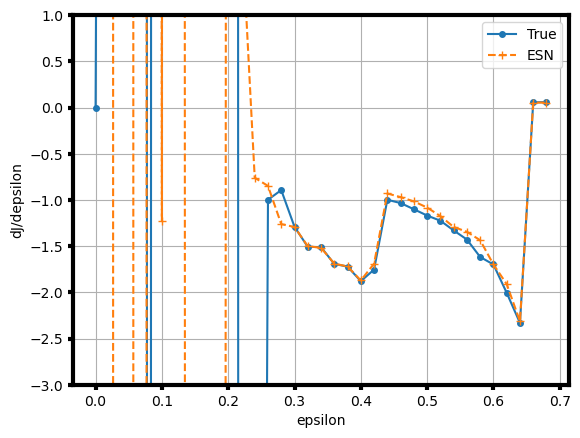

In [ ]:
plt.figure()
plt.plot(my_p_list,dJ_dp_num_true,linestyle = '-',marker = 'o', markersize = 4)
plt.plot(my_p_list,dJ_dp_num_esn,linestyle = '--',marker = '+')
plt.legend(["True","ESN"])
plt.ylabel("dJ/depsilon")
plt.xlabel("epsilon")
plt.ylim(-3,1)
plt.grid()